In [21]:
#Importing important libraries

import pandas as pd
import numpy as np
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from xgboost import XGBRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.neighbors import KNeighborsClassifier
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score, mean_squared_error, r2_score
from sklearn.naive_bayes import GaussianNB
from sklearn.impute import SimpleImputer
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, accuracy_score
from sklearn.impute import SimpleImputer

In [22]:
#Reading the data

data = pd.read_csv(r"C:\Users\sy090\Downloads\PROJECTS\comprehensive_banking_analytics\train.csv")
data.head()

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,...,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
0,5634,3392,1,Aaron Maashoh,23.0,821000265.0,Scientist,19114.12,1824.843333,3.0,...,Good,809.98,26.822620,265.0,No,49.574949,21.46538,High_spent_Small_value_payments,312.494089,Good
1,5635,3392,2,Aaron Maashoh,23.0,821000265.0,Scientist,19114.12,1824.843333,3.0,...,Good,809.98,31.944960,266.0,No,49.574949,21.46538,Low_spent_Large_value_payments,284.629162,Good
2,5636,3392,3,Aaron Maashoh,23.0,821000265.0,Scientist,19114.12,1824.843333,3.0,...,Good,809.98,28.609352,267.0,No,49.574949,21.46538,Low_spent_Medium_value_payments,331.209863,Good
3,5637,3392,4,Aaron Maashoh,23.0,821000265.0,Scientist,19114.12,1824.843333,3.0,...,Good,809.98,31.377862,268.0,No,49.574949,21.46538,Low_spent_Small_value_payments,223.451310,Good
4,5638,3392,5,Aaron Maashoh,23.0,821000265.0,Scientist,19114.12,1824.843333,3.0,...,Good,809.98,24.797347,269.0,No,49.574949,21.46538,High_spent_Medium_value_payments,341.489231,Good


In [23]:
#Checking the information related to each column of the dataframe

data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 28 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   ID                        100000 non-null  int64  
 1   Customer_ID               100000 non-null  int64  
 2   Month                     100000 non-null  int64  
 3   Name                      100000 non-null  object 
 4   Age                       100000 non-null  float64
 5   SSN                       100000 non-null  float64
 6   Occupation                100000 non-null  object 
 7   Annual_Income             100000 non-null  float64
 8   Monthly_Inhand_Salary     100000 non-null  float64
 9   Num_Bank_Accounts         100000 non-null  float64
 10  Num_Credit_Card           100000 non-null  float64
 11  Interest_Rate             100000 non-null  float64
 12  Num_of_Loan               100000 non-null  float64
 13  Type_of_Loan              100000 non-null  ob

In [24]:
#Checking the number of null values in each column

data.isnull().sum()

ID                          0
Customer_ID                 0
Month                       0
Name                        0
Age                         0
SSN                         0
Occupation                  0
Annual_Income               0
Monthly_Inhand_Salary       0
Num_Bank_Accounts           0
Num_Credit_Card             0
Interest_Rate               0
Num_of_Loan                 0
Type_of_Loan                0
Delay_from_due_date         0
Num_of_Delayed_Payment      0
Changed_Credit_Limit        0
Num_Credit_Inquiries        0
Credit_Mix                  0
Outstanding_Debt            0
Credit_Utilization_Ratio    0
Credit_History_Age          0
Payment_of_Min_Amount       0
Total_EMI_per_month         0
Amount_invested_monthly     0
Payment_Behaviour           0
Monthly_Balance             0
Credit_Score                0
dtype: int64

In [25]:
#Converting the categorical column into numerical column for getting various plots

data['Credit_Mix'] = data['Credit_Mix'].map({'Standard': 1, 'Good': 2, 'Bad': 0})

c:\Users\sy090\Downloads\PROJECTS\comprehensive_banking_analytics\env\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\sy090\Downloads\PROJECTS\comprehensive_banking_analytics\env\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\sy090\Downloads\PROJECTS\comprehensive_banking_analytics\env\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\sy090\Downloads\PROJECTS\comprehensive_banking_analytics\e

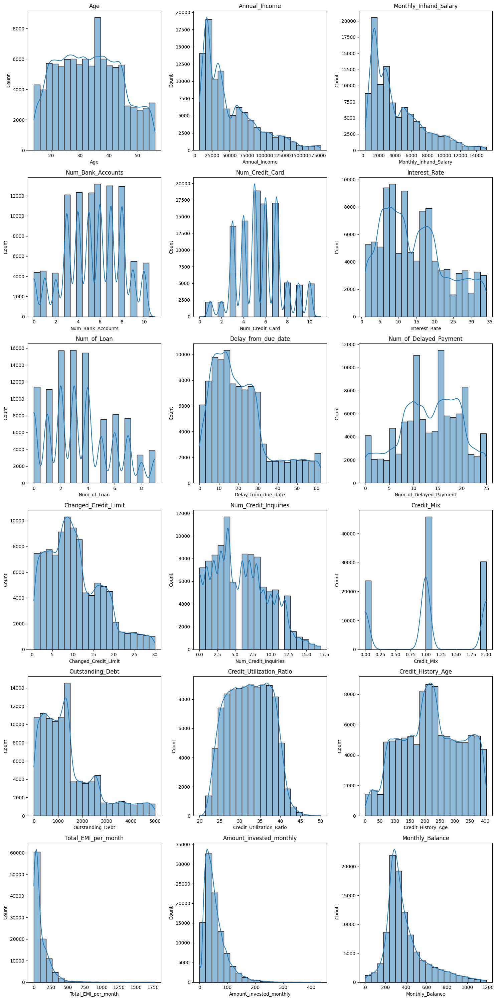

In [26]:
#EDA

#Plotting the histogram of numerical columns
raw_numerical_columns = data.select_dtypes(include=['number']).columns.tolist()
columns_to_drop = ['ID', 'Customer_ID', 'Month', 'Name', 'SSN', 'Payment_Behaviour', 'Occupation', 'Type_of_Loan', 'Payment_of_Min_Amount']
numerical_columns = [column for column in raw_numerical_columns if column not in columns_to_drop]

nc_df = data.drop(columns=['ID', 'Customer_ID', 'Month', 'Name', 'SSN', 'Payment_Behaviour', 'Occupation', 'Type_of_Loan', 'Payment_of_Min_Amount'])
num_plots = len(numerical_columns)
num_cols = min(num_plots, 3)  
num_rows = (num_plots - 1) // num_cols + 1 if num_plots > 1 else 1 

fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 5*num_rows))

if num_plots > 1:
    axes = axes.flatten()
else:
    axes = [axes]

for i, col in enumerate(numerical_columns):
    sns.histplot(nc_df[col], ax=axes[i], kde=True, bins=20)  # Adjust bins as needed
    axes[i].set_title(col)

for i in range(num_plots, num_rows * num_cols):
    fig.delaxes(axes[i])

plt.tight_layout()

plt.show(fig)

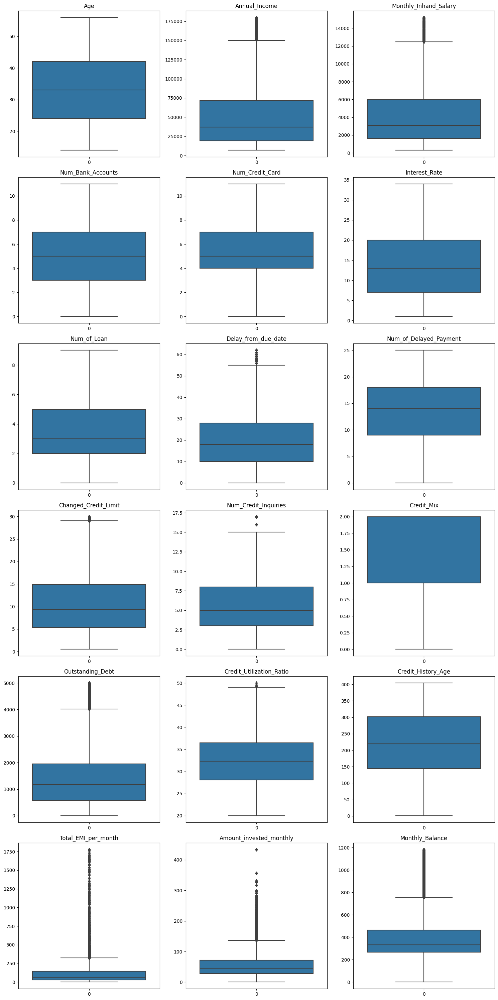

In [27]:
#EDA 

#Plotting the boxplots of numerical columns
raw_numerical_columns = data.select_dtypes(include=['number']).columns.tolist()
columns_to_drop = ['ID', 'Customer_ID', 'Month', 'Name', 'SSN', 'Payment_Behaviour', 'Occupation', 'Type_of_Loan', 'Payment_of_Min_Amount']
numerical_columns = [column for column in raw_numerical_columns if column not in columns_to_drop]

nc_df = data.drop(columns=['ID', 'Customer_ID', 'Month', 'Name', 'SSN', 'Payment_Behaviour', 'Occupation', 'Type_of_Loan', 'Payment_of_Min_Amount'])
num_plots = len(numerical_columns)
num_cols = min(num_plots, 3)  
num_rows = (num_plots - 1) // num_cols + 1 if num_plots > 1 else 1 

fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 5*num_rows))

if num_plots > 1:
    axes = axes.flatten()
else:
    axes = [axes]
    
for i, col in enumerate(numerical_columns):
            sns.boxplot(data=nc_df[col], ax=axes[i])
            axes[i].set_title(col)

for i in range(num_plots, num_rows * num_cols):
    fig.delaxes(axes[i])

plt.tight_layout()

plt.show(fig)

c:\Users\sy090\Downloads\PROJECTS\comprehensive_banking_analytics\env\Lib\site-packages\seaborn\matrix.py:260: FutureWarning: Format strings passed to MaskedConstant are ignored, but in future may error or produce different behavior
  annotation = ("{:" + self.fmt + "}").format(val)


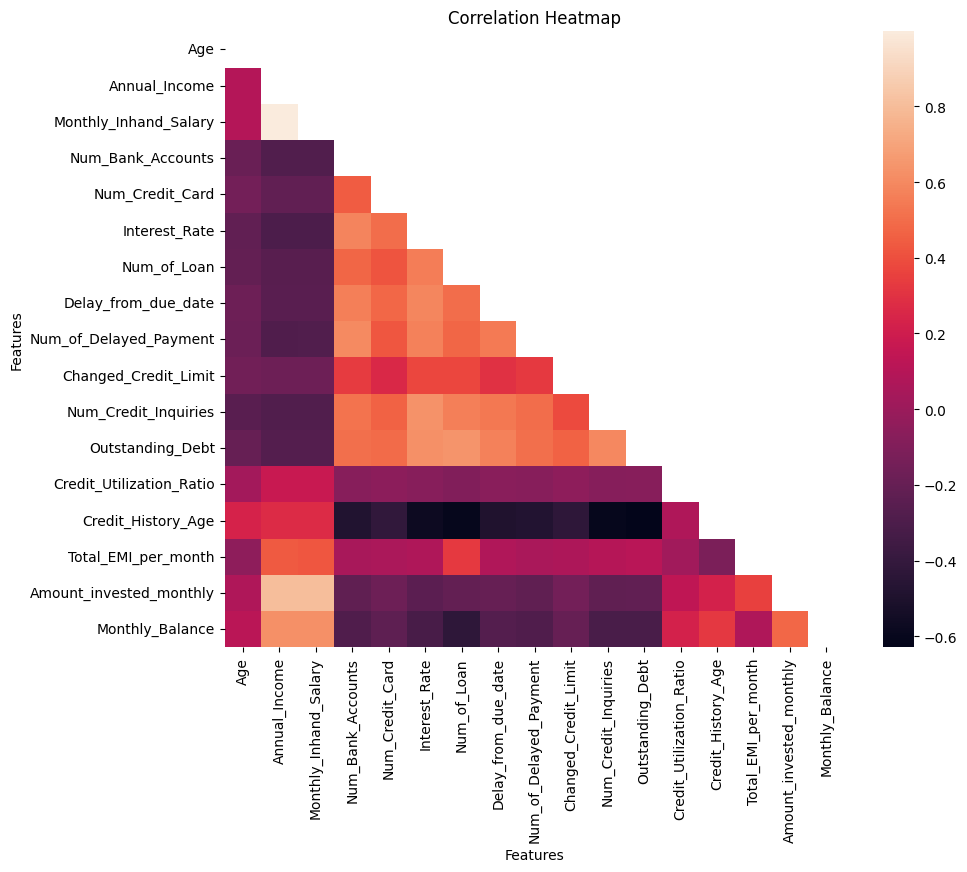

In [28]:
#Plotting the heatmap to check the correlation between columns

data_encoded = pd.get_dummies(data, columns=['Credit_Mix'])

nc_df = data_encoded.select_dtypes(include=['number'])
columns_to_drop = ['ID', 'Customer_ID', 'Month', 'Name', 'SSN', 'Payment_Behaviour', 'Occupation', 'Type_of_Loan', 'Payment_of_Min_Amount']
columns_to_drop = [col for col in columns_to_drop if col in nc_df.columns]
nc_df = nc_df.drop(columns=columns_to_drop)

corr_matrix = nc_df.corr()

plt.figure(figsize=(10, 8))
mask = np.triu(np.ones_like(corr_matrix))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", mask=mask)
plt.title('Correlation Heatmap')
plt.xlabel('Features')
plt.ylabel('Features')
plt.show()

c:\Users\sy090\Downloads\PROJECTS\comprehensive_banking_analytics\env\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\sy090\Downloads\PROJECTS\comprehensive_banking_analytics\env\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\sy090\Downloads\PROJECTS\comprehensive_banking_analytics\env\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\sy090\Downloads\PROJECTS\comprehensive_banking_analytics\e

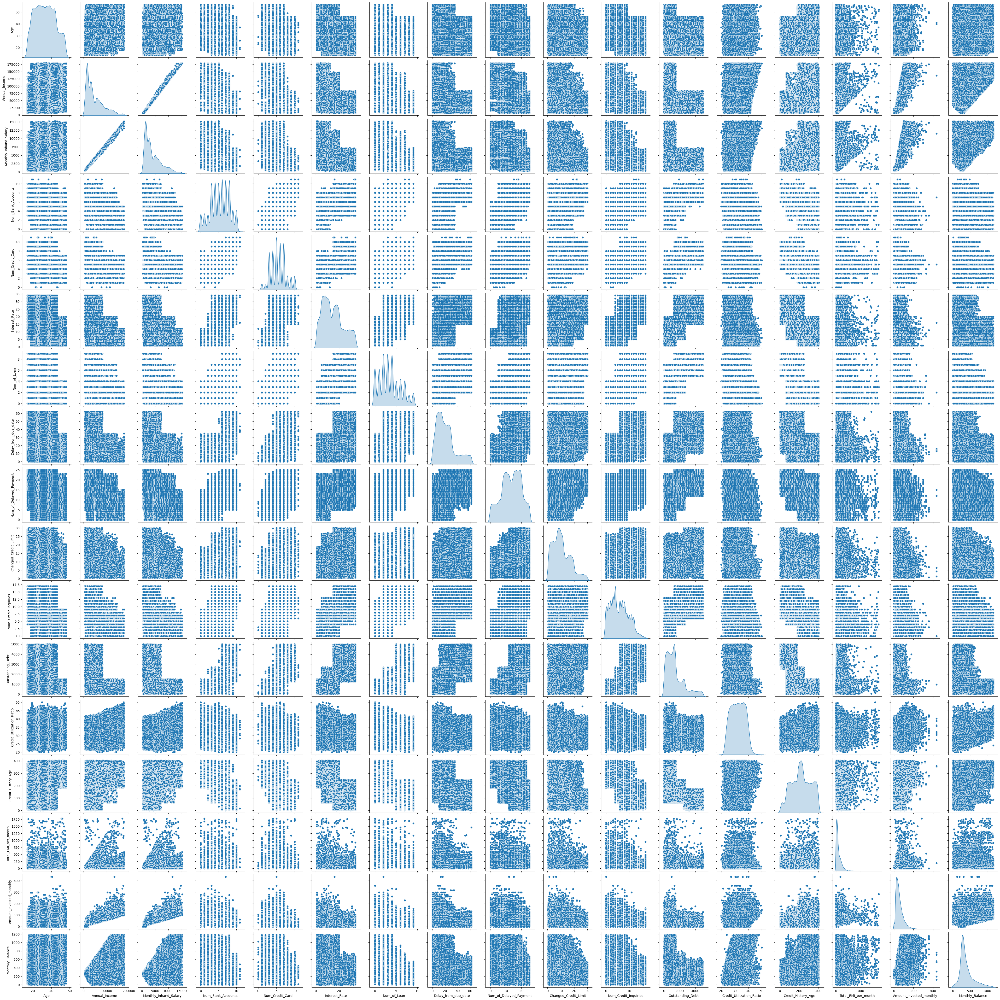

In [29]:
#EDA

#Pairplot
sns.pairplot(nc_df,diag_kind="kde")

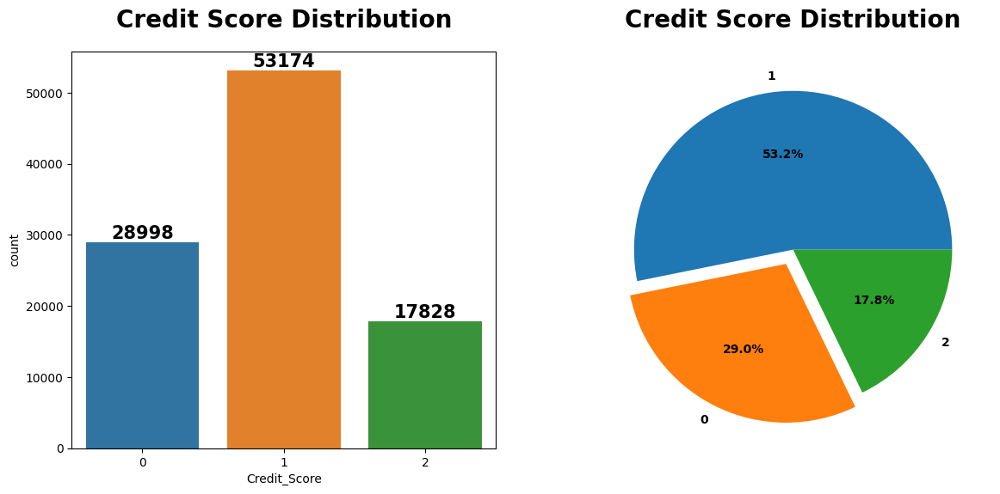

In [30]:
#EDA

#Visualizing the target variable
data = pd.read_csv(r"C:\Users\sy090\Downloads\PROJECTS\comprehensive_banking_analytics\train.csv")
data['Credit_Score'] = data['Credit_Score'].map({'Standard': 1, 'Good': 2,'Poor': 0})

count = data["Credit_Score"].value_counts()
plt.figure(figsize=(14,6))
plt.subplot(1,2,1)
ax=sns.countplot(data=data, x="Credit_Score")
ax.bar_label(ax.containers[0],fontweight="black",size=15)
plt.title("Credit Score Distribution",fontweight="black",size=20,pad=20)

plt.subplot(1,2,2)
plt.pie(count.values, labels=count.index, autopct="%1.1f%%",
        textprops={"fontweight":"black"},explode=(0,0.1,0))
plt.title("Credit Score Distribution",fontweight="black",size=20,pad=20)
plt.show()

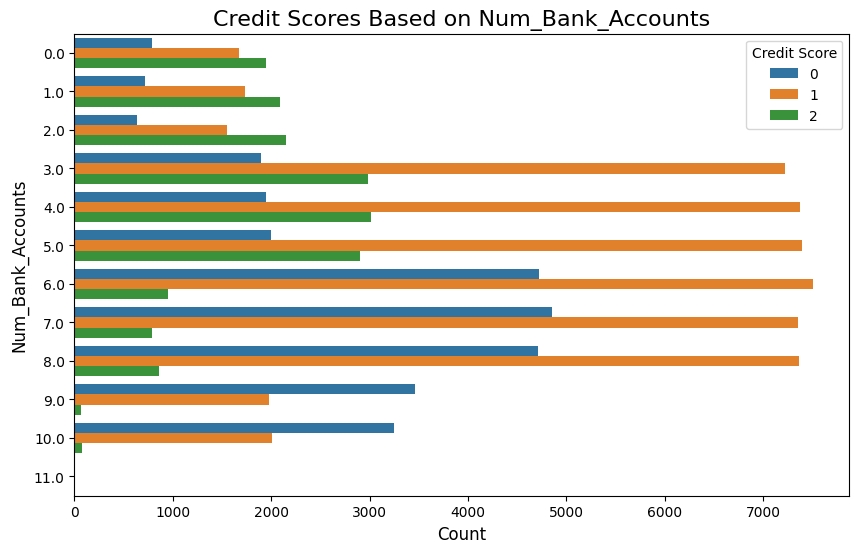

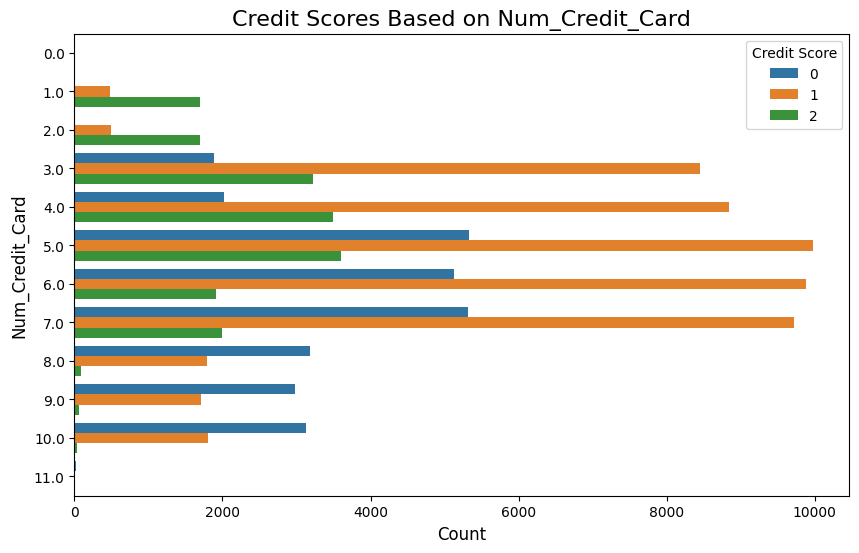

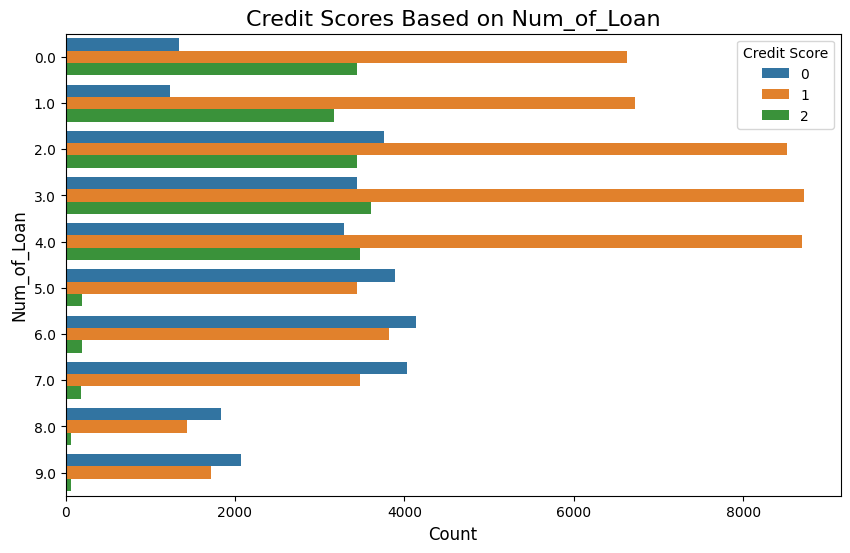

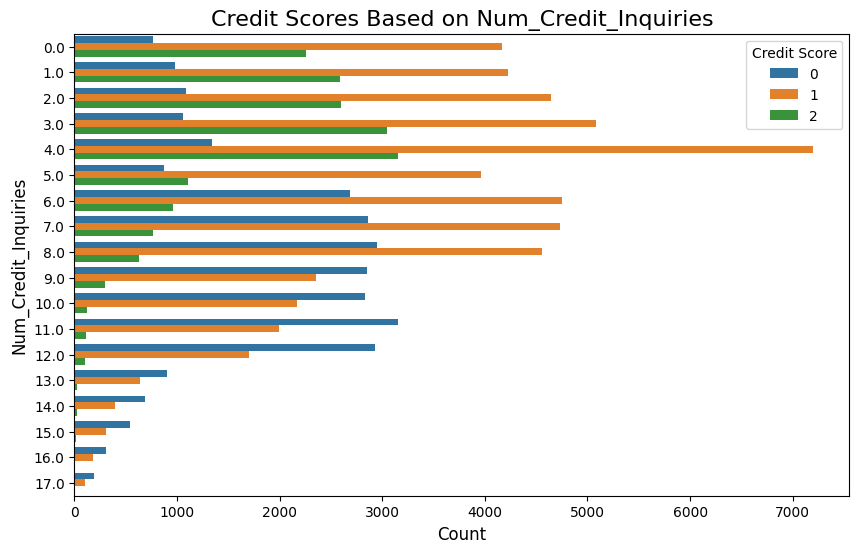

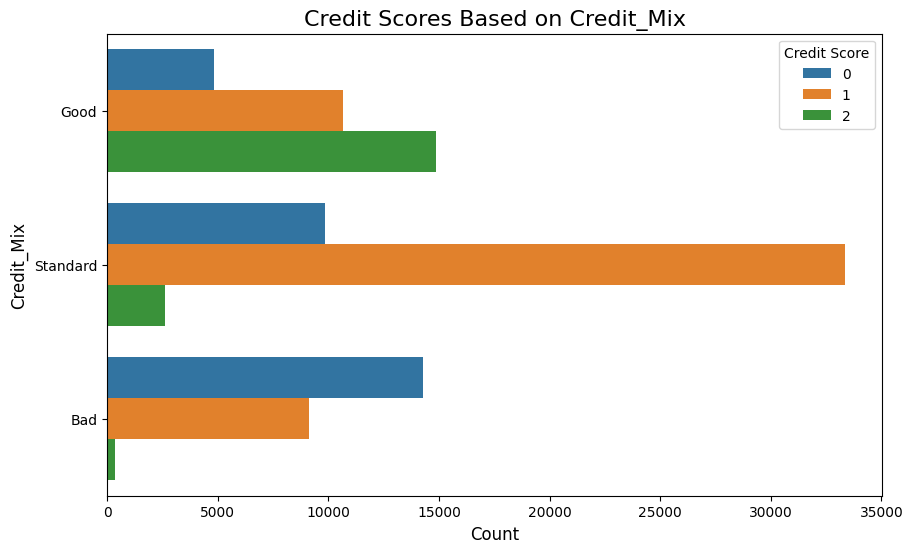

In [31]:
#EDA

#Plotting countplots to see if the features selected are affecting the credit score or not
y_list = ['Num_Bank_Accounts', 'Num_Credit_Card', 
          'Num_of_Loan', 'Num_Credit_Inquiries', 
          'Credit_Mix'] 

# Iterate through each feature in the list
for y_feature in y_list:
    plt.figure(figsize=(10, 6))
    sns.countplot(y=y_feature, hue='Credit_Score', data=data)
    plt.title(f'Credit Scores Based on {y_feature}', fontsize=16)
    plt.xlabel('Count', fontsize=12)
    plt.ylabel(y_feature, fontsize=12)
    plt.legend(title='Credit Score', fontsize=10)
    plt.show()

In [32]:
#Reading the data and converting the categorical column into numerical column

data = pd.read_csv(r"C:\Users\sy090\Downloads\PROJECTS\comprehensive_banking_analytics\train.csv")
#Converting the categorical column into numerical column to get a numerical target column for customer segmentation based on the credit scores

data['Credit_Score'] = data['Credit_Score'].map({'Standard': 1,
                                            'Good': 2,
                                            'Poor': 0})

data['Credit_Mix'] = data['Credit_Mix'].map({'Standard': 1,
                                            'Good': 2,
                                            'Bad': 0})

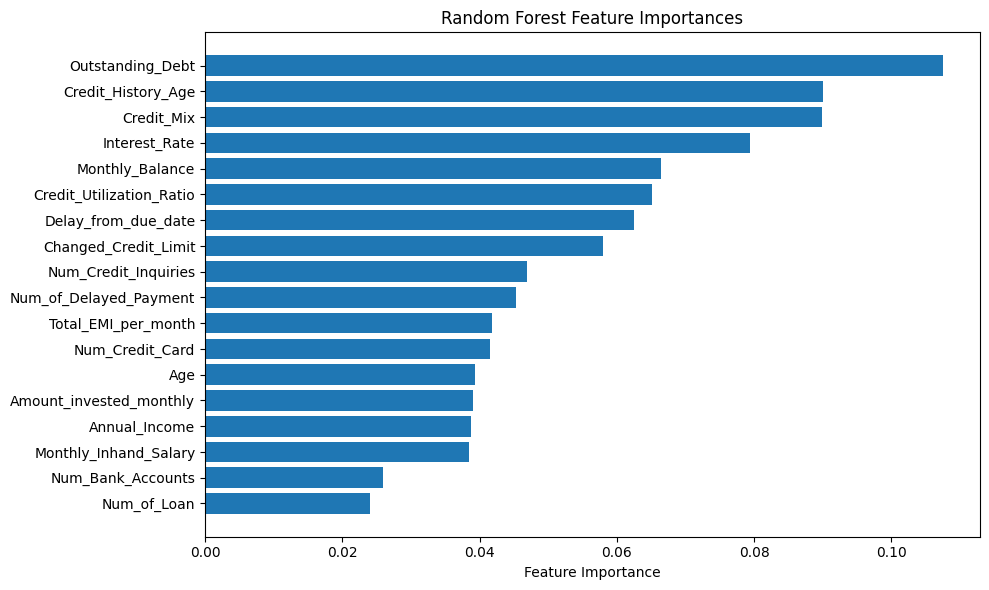

In [33]:
# Plotting feature importances

X_classification = data.drop(columns=['ID', 'Customer_ID', 'Month', 'Name', 'SSN', 'Payment_Behaviour', 'Occupation', 'Type_of_Loan', 'Payment_of_Min_Amount', 'Credit_Score'])
y_classification = data['Credit_Score']
X_train, X_test, y_train, y_test = train_test_split(X_classification, y_classification, test_size=0.2, random_state=42)
rf_classifier = RandomForestClassifier(n_estimators=100, random_state=42)
rf_classifier.fit(X_classification, y_classification)
feature_importances = rf_classifier.feature_importances_
feature_names = X_classification.columns
sorted_idx = np.argsort(feature_importances)

plt.figure(figsize=(10, 6))
plt.barh(range(len(sorted_idx)), feature_importances[sorted_idx], align="center")
plt.yticks(range(len(sorted_idx)), [feature_names[i] for i in sorted_idx])
plt.xlabel("Feature Importance")
plt.title("Random Forest Feature Importances")
plt.tight_layout()
plt.show()

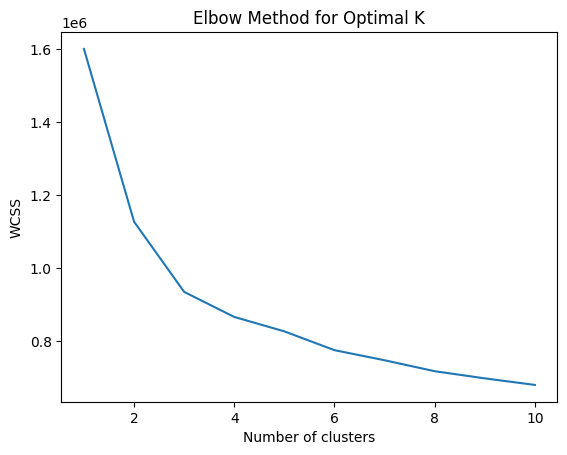

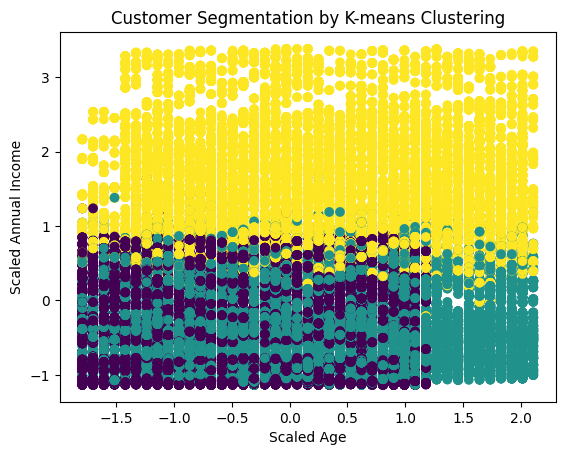

In [34]:
#Customer Segmentation

X_cluster = data.drop(columns=['ID', 'Customer_ID', 'Month', 'Name', 'SSN', 'Payment_Behaviour', 'Occupation', 'Type_of_Loan', 
                               'Payment_of_Min_Amount', 'Delay_from_due_date', 'Num_Credit_Inquiries', 'Credit_Utilization_Ratio'])
imputer = SimpleImputer(strategy='median')
X_cluster_imputed = imputer.fit_transform(X_cluster)

scaler = StandardScaler()
X_cluster_scaled = scaler.fit_transform(X_cluster_imputed)

wcss = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, init='k-means++', random_state=42)
    kmeans.fit(X_cluster_scaled)
    wcss.append(kmeans.inertia_)

#Plotting the elbow method graph
plt.plot(range(1, 11), wcss)
plt.title('Elbow Method for Optimal K')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

k = 3 #Based on the Elbow method, let's say we choose K=4

#Applying K-means clustering with K=4
kmeans = KMeans(n_clusters=k, init='k-means++', random_state=42)
kmeans.fit(X_cluster_scaled)

data['Cluster'] = kmeans.labels_

#Visualizing the clusters (assuming 2D visualization)
plt.scatter(X_cluster_scaled[:, 0], X_cluster_scaled[:, 1], c=kmeans.labels_, cmap='viridis')
plt.xlabel('Scaled Age')
plt.ylabel('Scaled Annual Income')
plt.title('Customer Segmentation by K-means Clustering')
plt.show()

In [35]:
data = pd.read_csv(r"C:\Users\sy090\Downloads\PROJECTS\comprehensive_banking_analytics\train.csv")
data['Credit_Mix'] = data['Credit_Mix'].map({'Standard': 1,
                                            'Good': 2,
                                            'Bad': 0})
data['Credit_Score'] = data['Credit_Score'].map({'Standard': 1,
                                            'Good': 2,
                                            'Poor': 0})

In [36]:
#Credit Risk Assessment

# Select relevant features for credit risk assessment
X_classification = data.drop(columns=['ID', 'Customer_ID', 'Month', 'Name', 'SSN', 'Payment_Behaviour', 'Occupation', 'Type_of_Loan', 'Payment_of_Min_Amount'])
y_classification = data['Credit_Score']

X_train, X_test, y_train, y_test = train_test_split(X_classification, y_classification, test_size=0.2, random_state=42)

classifiers = {
    "Logistic Regression": LogisticRegression(max_iter=1000, solver='liblinear'),
    "Decision Tree": DecisionTreeClassifier(),
    "Random Forest": RandomForestClassifier(),
    "XGBoost": XGBClassifier(),
    "KNN": KNeighborsClassifier(),
    "Naive Bayes": GaussianNB()
}

for name, classifier in classifiers.items():
    classifier.fit(X_train, y_train)
    
    y_pred = classifier.predict(X_test)
    
    accuracy = accuracy_score(y_test, y_pred)
    report = classification_report(y_test, y_pred, output_dict=True)
    
    print(f"Classifier: {name}")
    print(f"Accuracy: {accuracy}")
    print("Classification Report:")
    print(classification_report(y_test, y_pred))
    print("----------")

Classifier: Logistic Regression
Accuracy: 0.93325
Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      5874
           1       0.91      0.96      0.94     10599
           2       0.87      0.73      0.79      3527

    accuracy                           0.93     20000
   macro avg       0.93      0.90      0.91     20000
weighted avg       0.93      0.93      0.93     20000

----------
Classifier: Decision Tree
Accuracy: 1.0
Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      5874
           1       1.00      1.00      1.00     10599
           2       1.00      1.00      1.00      3527

    accuracy                           1.00     20000
   macro avg       1.00      1.00      1.00     20000
weighted avg       1.00      1.00      1.00     20000

----------
Classifier: Random Forest
Accuracy: 1.0
Classification Report:
              pre

In [37]:
#Performane Prediction

#Select relevant features for performance prediction
X_regression = data.drop(columns=['ID', 'Customer_ID', 'Month', 'Name', 'SSN', 'Payment_Behaviour', 'Occupation', 'Type_of_Loan', 'Payment_of_Min_Amount'])
y_regression = data['Credit_Score']

X_train, X_test, y_train, y_test = train_test_split(X_regression, y_regression, test_size=0.2, random_state=42)

models = {
    "Linear Regression": LinearRegression(),
    "Decision Tree Regressor": DecisionTreeRegressor(),
    "Random Forest Regressor": RandomForestRegressor(),
    "Gradient Boosting Regressor": GradientBoostingRegressor(),
    "XGBoost Regressor": XGBRegressor(),
    "KNeighbors Regressor": KNeighborsRegressor()
}

for name, model in models.items():
    model.fit(X_train, y_train)

for name, model in models.items():
    y_pred = model.predict(X_test)
    mse = mean_squared_error(y_test, y_pred)
    rmse = mse ** 0.5
    r2 = r2_score(y_test, y_pred)
    print(f"Model: {name}")
    print(f"Root Mean Squared Error (RMSE): {rmse}")
    print(f"R2 Score: {r2}")
    print("----------")

Model: Linear Regression
Root Mean Squared Error (RMSE): 2.8070534180026826e-15
R2 Score: 1.0
----------
Model: Decision Tree Regressor
Root Mean Squared Error (RMSE): 0.0
R2 Score: 1.0
----------
Model: Random Forest Regressor
Root Mean Squared Error (RMSE): 0.0
R2 Score: 1.0
----------
Model: Gradient Boosting Regressor
Root Mean Squared Error (RMSE): 1.794278735749497e-05
R2 Score: 0.999999999294415
----------
Model: XGBoost Regressor
Root Mean Squared Error (RMSE): 3.329686164276412e-06
R2 Score: 0.9999999999757017
----------
Model: KNeighbors Regressor
Root Mean Squared Error (RMSE): 0.4220118481749061
R2 Score: 0.6096817763207161
----------
